In [15]:
import hail as hl
hl.init()

ConnectionRefusedError: [Errno 61] Connection refused

In [16]:
import onnx
from gnomad.sample_qc.ancestry import apply_onnx_classification_model, assign_population_pcs
import pandas as pd
import umap
import matplotlib.pyplot as plt
import seaborn as sns

from bokeh.io import show
from bokeh.layouts import gridplot

get ancestry assignments

In [17]:
gnomad_v3_onnx_rf = "../RF_gnomad_models/gnomad.v3.1.RF_fit.onnx"
with hl.hadoop_open(gnomad_v3_onnx_rf, "rb") as f:
    v3_onx_fit = onnx.load(f)

ConnectionRefusedError: [Errno 61] Connection refused

In [4]:
v3_num_pcs = 16
v3_min_prob = 0.75

In [5]:
v3_pcs_ht = hl.import_table("../gnomad_pca_projections/v3_good_call_rate_mt_pcs_ht.tsv", key="s", types = {"scores": hl.dtype('array<float>')})
v3_pcs_ht.show()

2024-05-30 17:48:15.074 Hail: INFO: Reading table without type imputation
  Loading field 's' as type str (not specified)
  Loading field 'scores' as type array<float64> (user-supplied)


,
s,scores
str,array<float64>
"""CW-170-S""","[2.74e-02,-9.26e-03,-5.28e-03,-2.18e-02,1.76e-02,-5.66e-02,7.82e-03,3.89e-03,3.16e-03,-8.05e-03,2.27e-02,4.14e-05,4.43e-03,-5.02e-03,-1.47e-04,3.46e-05,4.67e-04,1.10e-03,2.30e-03,-7.01e-04,-1.71e-03,-2.43e-03,2.83e-04,-9.20e-04,-1.73e-03,4.53e-04,-6.30e-04,-1.55e-04,-2.15e-03,-1.98e-04]"
"""CW-179-S""","[3.72e-02,-1.63e-02,3.51e-04,-8.87e-03,-1.14e-02,4.63e-03,-3.74e-03,-4.50e-03,1.23e-03,-2.08e-03,3.52e-04,-1.57e-03,-3.90e-03,5.17e-03,-5.64e-06,1.56e-03,-2.41e-04,1.44e-03,2.34e-06,1.56e-03,2.48e-05,-2.16e-03,-2.31e-03,2.56e-04,-2.46e-03,-5.55e-04,4.48e-04,-4.20e-03,1.36e-04,2.54e-03]"
"""CW117-S""","[2.74e-02,-7.84e-03,-1.06e-03,-2.23e-02,2.29e-02,-6.72e-02,1.29e-02,3.58e-03,1.15e-04,-1.12e-02,2.47e-02,3.36e-03,6.97e-03,-2.54e-03,9.08e-04,2.24e-03,-2.21e-03,7.80e-04,2.24e-03,1.49e-03,9.49e-04,3.07e-03,-5.21e-04,-1.78e-03,-1.44e-03,-3.18e-03,-1.96e-03,-2.62e-03,2.37e-04,3.26e-03]"
"""CW12S""","[3.02e-02,-8.42e-03,-2.54e-03,-2.03e-02,1.67e-02,-5.45e-02,1.10e-02,4.03e-03,1.61e-04,-9.00e-03,1.38e-02,2.44e-03,8.27e-03,-6.16e-03,-2.72e-03,1.02e-03,1.65e-03,1.87e-03,-3.45e-03,-7.06e-04,-1.48e-03,8.55e-04,2.45e-03,-3.10e-03,2.27e-03,9.87e-04,2.09e-03,-3.89e-03,8.55e-05,-9.76e-04]"
"""CW140-G""","[3.33e-02,-1.37e-02,-4.50e-03,-1.78e-02,9.57e-03,-2.19e-02,-6.78e-03,-1.10e-03,-1.48e-03,-7.94e-04,-1.14e-02,-3.23e-03,-1.36e-02,1.47e-02,-1.38e-03,4.68e-03,-1.91e-03,4.87e-03,9.04e-04,1.33e-03,5.56e-04,3.05e-03,4.72e-04,7.60e-04,-5.55e-03,-5.85e-03,-3.08e-03,-6.00e-03,3.21e-03,5.80e-03]"
"""CW215-S""","[2.62e-02,-1.11e-02,-1.15e-03,-2.01e-02,1.82e-02,-6.26e-02,1.22e-02,5.16e-04,1.77e-03,-1.21e-02,1.75e-02,2.49e-03,6.23e-03,-6.47e-03,-1.83e-03,6.06e-04,2.02e-03,-9.25e-04,8.32e-04,3.03e-03,6.35e-04,3.28e-04,-3.81e-04,-2.35e-03,2.67e-03,4.22e-04,1.24e-04,-4.72e-04,9.17e-04,2.24e-03]"
"""CW226-S""","[3.82e-02,-1.72e-02,3.78e-03,-9.29e-03,-1.28e-02,3.79e-03,-2.17e-03,-4.60e-03,-2.28e-04,-4.58e-03,3.09e-03,5.65e-04,2.61e-03,-1.62e-03,1.49e-03,1.52e-03,6.57e-04,-2.96e-03,-1.73e-04,-8.09e-04,-2.31e-04,3.88e-03,1.55e-03,-2.26e-03,1.42e-03,-2.11e-03,-2.03e-03,-1.28e-03,1.05e-03,-3.77e-04]"
"""CW232-S""","[2.94e-02,-1.27e-02,2.86e-03,-1.25e-02,-5.07e-04,-1.28e-02,-8.95e-04,-5.99e-03,-6.22e-04,-8.69e-04,-4.57e-03,-2.60e-04,-1.08e-02,8.16e-03,1.88e-04,9.57e-04,-3.08e-04,-1.79e-03,3.19e-03,1.69e-03,-1.06e-03,-8.08e-04,-2.50e-03,-3.27e-04,-7.05e-03,-4.34e-04,1.43e-03,-2.44e-03,3.45e-03,-1.10e-04]"


In [6]:
v3_results_ht, v3_model = assign_population_pcs(
    v3_pcs_ht,
    pc_cols=v3_pcs_ht.scores[:v3_num_pcs],
    fit=v3_onx_fit,
    min_prob=v3_min_prob,
    apply_model_func = apply_onnx_classification_model
)

2024-05-30 17:48:17.036 Hail: INFO: Coerced sorted dataset
INFO (gnomad.sample_qc.ancestry 369): Found the following sample count after population assignment: oth: 332, sas: 1, afr: 1, amr: 2


In [7]:
v3_results_ht.show()

,,,,,,,,,,,,
s,pca_scores,pop,prob_afr,prob_ami,prob_amr,prob_asj,prob_eas,prob_fin,prob_mid,prob_nfe,prob_oth,prob_sas
str,array<float64>,str,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
"""CW-170-S""","[2.74e-02,-9.26e-03,-5.28e-03,-2.18e-02,1.76e-02,-5.66e-02,7.82e-03,3.89e-03,3.16e-03,-8.05e-03,2.27e-02,4.14e-05,4.43e-03,-5.02e-03,-1.47e-04,3.46e-05]","""oth""",7.00e-02,0.00e+00,8.00e-02,1.70e-01,2.00e-02,1.00e-02,2.00e-02,6.10e-01,1.00e-02,1.00e-02
"""CW-179-S""","[3.72e-02,-1.63e-02,3.51e-04,-8.87e-03,-1.14e-02,4.63e-03,-3.74e-03,-4.50e-03,1.23e-03,-2.08e-03,3.52e-04,-1.57e-03,-3.90e-03,5.17e-03,-5.64e-06,1.56e-03]","""oth""",1.20e-01,0.00e+00,2.40e-01,1.00e-02,5.00e-02,1.00e-02,0.00e+00,5.50e-01,0.00e+00,2.00e-02
"""CW117-S""","[2.74e-02,-7.84e-03,-1.06e-03,-2.23e-02,2.29e-02,-6.72e-02,1.29e-02,3.58e-03,1.15e-04,-1.12e-02,2.47e-02,3.36e-03,6.97e-03,-2.54e-03,9.08e-04,2.24e-03]","""oth""",5.00e-02,0.00e+00,5.00e-02,2.00e-01,3.00e-02,1.00e-02,2.00e-02,6.30e-01,1.00e-02,0.00e+00
"""CW12S""","[3.02e-02,-8.42e-03,-2.54e-03,-2.03e-02,1.67e-02,-5.45e-02,1.10e-02,4.03e-03,1.61e-04,-9.00e-03,1.38e-02,2.44e-03,8.27e-03,-6.16e-03,-2.72e-03,1.02e-03]","""oth""",5.00e-02,0.00e+00,1.40e-01,1.00e-01,3.00e-02,2.00e-02,3.00e-02,6.00e-01,0.00e+00,3.00e-02
"""CW140-G""","[3.33e-02,-1.37e-02,-4.50e-03,-1.78e-02,9.57e-03,-2.19e-02,-6.78e-03,-1.10e-03,-1.48e-03,-7.94e-04,-1.14e-02,-3.23e-03,-1.36e-02,1.47e-02,-1.38e-03,4.68e-03]","""oth""",5.00e-02,0.00e+00,2.80e-01,1.00e-02,4.00e-02,0.00e+00,1.00e-02,5.70e-01,0.00e+00,4.00e-02
"""CW215-S""","[2.62e-02,-1.11e-02,-1.15e-03,-2.01e-02,1.82e-02,-6.26e-02,1.22e-02,5.16e-04,1.77e-03,-1.21e-02,1.75e-02,2.49e-03,6.23e-03,-6.47e-03,-1.83e-03,6.06e-04]","""oth""",4.00e-02,0.00e+00,6.00e-02,1.90e-01,4.00e-02,2.00e-02,2.00e-02,6.10e-01,0.00e+00,2.00e-02
"""CW226-S""","[3.82e-02,-1.72e-02,3.78e-03,-9.29e-03,-1.28e-02,3.79e-03,-2.17e-03,-4.60e-03,-2.28e-04,-4.58e-03,3.09e-03,5.65e-04,2.61e-03,-1.62e-03,1.49e-03,1.52e-03]","""oth""",1.30e-01,0.00e+00,1.90e-01,1.00e-02,6.00e-02,1.00e-02,0.00e+00,5.70e-01,0.00e+00,3.00e-02
"""CW232-S""","[2.94e-02,-1.27e-02,2.86e-03,-1.25e-02,-5.07e-04,-1.28e-02,-8.95e-04,-5.99e-03,-6.22e-04,-8.69e-04,-4.57e-03,-2.60e-04,-1.08e-02,8.16e-03,1.88e-04,9.57e-04]","""oth""",9.00e-02,0.00e+00,2.90e-01,2.00e-02,4.00e-02,2.00e-02,0.00e+00,4.90e-01,0.00e+00,5.00e-02


In [8]:
v3_results_ht.summarize()

2024-05-30 17:48:23.350 Hail: INFO: Coerced sorted dataset


Non-missing,336 (100.00%)
Missing,0
Min Size,5
Max Size,14
Mean Size,11.01
Sample Values,"['CW-170-S', 'CW-179-S', 'CW117-S', 'CW12S', 'CW140-G']"
Non-missing,336 (100.00%)
Missing,0
Min Size,16
Max Size,16
Mean Size,16.00


In [9]:
v3_results_ht.filter(v3_results_ht.pop != "oth").show()

,,,,,,,,,,,,
s,pca_scores,pop,prob_afr,prob_ami,prob_amr,prob_asj,prob_eas,prob_fin,prob_mid,prob_nfe,prob_oth,prob_sas
str,array<float64>,str,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
"""DFCI-307X-C""","[2.06e-02,3.07e-02,-2.78e-03,-8.33e-03,8.20e-02,2.43e-02,-9.60e-04,1.03e-03,-5.29e-05,2.25e-03,4.12e-04,-2.78e-03,1.60e-03,-7.25e-04,2.21e-03,1.20e-03]","""sas""",0.00e+00,0.00e+00,1.00e-02,0.00e+00,0.00e+00,2.00e-02,0.00e+00,2.00e-02,5.00e-02,9.00e-01
"""DFCI-503P-C""","[-1.25e-01,-1.24e-03,4.14e-03,2.76e-03,-7.65e-04,3.23e-03,-3.17e-03,-5.19e-04,8.29e-04,1.86e-04,1.42e-03,-1.30e-03,-2.83e-03,3.41e-03,7.61e-03,-2.27e-03]","""afr""",1.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00,0.00e+00
"""JB-0375-N-01""","[1.92e-03,6.49e-03,-3.31e-02,2.76e-03,-1.56e-03,-1.25e-02,-5.10e-03,-3.56e-03,-2.54e-04,3.84e-03,-4.03e-02,3.16e-03,2.42e-02,-1.91e-02,-2.74e-03,6.33e-03]","""amr""",3.00e-02,0.00e+00,9.50e-01,0.00e+00,0.00e+00,0.00e+00,0.00e+00,1.00e-02,0.00e+00,1.00e-02
"""MDA-046-000-FB""","[2.89e-02,3.37e-03,-2.70e-02,-4.22e-03,-8.09e-03,-8.62e-03,-7.27e-03,-4.73e-03,-2.86e-03,1.05e-02,-7.78e-03,-1.06e-04,-4.94e-03,2.58e-03,2.22e-03,2.09e-03]","""amr""",1.10e-01,0.00e+00,8.60e-01,0.00e+00,2.00e-02,0.00e+00,0.00e+00,1.00e-02,0.00e+00,0.00e+00


In [10]:
v3_results_ht.filter(v3_results_ht.pop != "oth")['s'].collect()

['DFCI-307X-C', 'DFCI-503P-C', 'JB-0375-N-01', 'MDA-046-000-FB']

In [11]:
v3_results_ht = v3_results_ht.annotate(prob_eur = v3_results_ht.prob_fin + v3_results_ht.prob_nfe +
                                                  v3_results_ht.prob_ami + v3_results_ht.prob_asj)
v3_results_ht.prob_eur.summarize()

Non-missing,336 (100.00%)
Missing,0
Minimum,0.00
Maximum,0.89
Mean,0.63
Std Dev,0.13


In [91]:
other_ht = v3_results_ht.filter(v3_results_ht.pop == "oth")
prob_eur_hist = other_ht.aggregate(hl.agg.hist(other_ht.prob_eur, 0, 1, 30))
p = hl.plot.histogram(prob_eur_hist)
show(p)

In [172]:
v3_results_df = pd.read_csv("../gnomad_pca_projections/v3_full_mt_pcs_ht.tsv", sep="\t", index_col=0)
v3_results_df.loc[:, "scores"] = v3_results_df.scores.apply(lambda x: [float(y) for y in x.strip("[]").split(",")])
v3_results_df.head()

,scores
s,
CW-170-S,"[0.02749848023072274, -0.009380462380525022, -..."
CW-179-S,"[0.037354535903246264, -0.016291596208688627, ..."
CW117-S,"[0.02729404950594506, -0.007999803860556355, -..."
CW12S,"[0.030188231625484594, -0.008598791437857588, ..."
CW140-G,"[0.033299345584652786, -0.013600505694917473, ..."


In [173]:
len(v3_results_df.scores.iloc[0])

30

In [174]:
v3_results_df.loc[:, "scores"] = v3_results_df.scores.apply(lambda x: x[0:10])
len(v3_results_df.scores.iloc[0])

10

In [175]:
pc_cols = ["PC" + str(i) for i in range(1,11)]
v3_results_df = pd.DataFrame(v3_results_df.scores.to_list(), index=v3_results_df.index, columns=pc_cols)
v3_results_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
s,,,,,,,,,,
CW-170-S,0.027498,-0.009380,-0.005408,-0.021846,0.017739,-0.056636,0.007746,0.003890,0.003096,-0.008040
CW-179-S,0.037355,-0.016292,0.000204,-0.008832,-0.011278,0.004619,-0.003746,-0.004510,0.001225,-0.002043
CW117-S,0.027294,-0.008000,-0.001392,-0.022240,0.022865,-0.067338,0.012936,0.003642,-0.000045,-0.010805
CW12S,0.030188,-0.008599,-0.002486,-0.020124,0.016699,-0.054517,0.011469,0.004332,0.000098,-0.008887
CW140-G,0.033299,-0.013601,-0.004644,-0.017774,0.009850,-0.021879,-0.006876,-0.001128,-0.001331,-0.000890


In [176]:
reducer = umap.UMAP()

embedding = reducer.fit_transform(v3_results_df)
embedding.shape

(336, 2)

In [177]:
embedding_df = pd.DataFrame(embedding, index=v3_results_df.index)

In [178]:
non_euro_samples = v3_results_ht.filter(v3_results_ht.pop != "oth")['s'].collect()
embedding_df.loc[:, "ancestry"] = "european"
embedding_df.loc[non_euro_samples, "ancestry"] = "non_european"
embedding_df.head()

,0,1,ancestry
s,,,
CW-170-S,-5.057642,11.422779,european
CW-179-S,9.182401,13.291236,european
CW117-S,-3.394162,12.258616,european
CW12S,-4.920690,11.647180,european
CW140-G,9.517176,7.684819,european


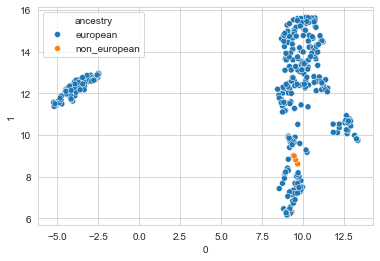

In [179]:
sns.scatterplot(embedding_df, x=0, y=1, hue=embedding_df["ancestry"])
plt.show()

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

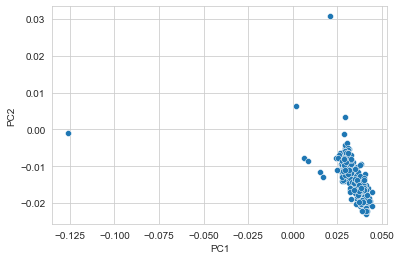

In [180]:
sns.scatterplot(v3_results_df, x="PC1", y="PC2")

In [181]:
v3_model

ir_version: 8
producer_name: "skl2onnx"
producer_version: "1.14.1"
domain: "ai.onnx"
model_version: 0
doc_string: ""
graph {
  node {
    input: "float_input"
    output: "label"
    output: "probabilities"
    name: "TreeEnsembleClassifier"
    op_type: "TreeEnsembleClassifier"
    attribute {
      name: "class_ids"
      ints: 0
      ints: 1
      ints: 2
      ints: 3
      ints: 4
      ints: 5
      ints: 6
      ints: 7
      ints: 8
      ints: 9
      ints: 0
      ints: 1
      ints: 2
      ints: 3
      ints: 4
      ints: 5
      ints: 6
      ints: 7
      ints: 8
      ints: 9
      ints: 0
      ints: 1
      ints: 2
      ints: 3
      ints: 4
      ints: 5
      ints: 6
      ints: 7
      ints: 8
      ints: 9
      ints: 0
      ints: 1
      ints: 2
      ints: 3
      ints: 4
      ints: 5
      ints: 6
      ints: 7
      ints: 8
      ints: 9
      ints: 0
      ints: 1
      ints: 2
      ints: 3
      ints: 4
      ints: 5
      ints: 6
      ints: 7
      in

In [182]:
type(v3_model)

onnx.onnx_ml_pb2.ModelProto

In [12]:
from onnx.tools.net_drawer import GetPydotGraph, GetOpNodeProducer

In [13]:
from onnx.tools.net_drawer import GetPydotGraph, GetOpNodeProducer
pydot_graph = GetPydotGraph(v3_model.graph, name=v3_model.graph.name, rankdir="TP",
                            node_producer=GetOpNodeProducer("docstring"))
pydot_graph.write_dot("graph.dot")

import os  # noqa: E402

os.system("dot -O -Tpng graph.dot")

0